In [8]:
using CSV
using DataFrames
using Plots
using MMCAcovid19
using Random
using Distributions
using LightGraphs
using NamedArrays
using LinearAlgebra
using Dates


In [2]:
data_path = "../data_provinces"

provincias = CSV.read(joinpath(data_path, "provincias.csv"), DataFrame)
nᵢᵍ = copy(transpose(convert(Array{Float64,2}, provincias[:,["Y", "M", "O"]])))
nᵢ = sum(nᵢᵍ, dims=1)
nothing

real_data = CSV.read(joinpath(data_path, "real_covid_data.csv"), DataFrame)
days = max(real_data[:,"t"]...) + 1
patches = max(real_data[:, "idx"]...)
real_incidence = zeros(patches, days)
nothing

tstart = 39 # model starts at 2020-02-09
tend = tstart+420
real_incidence = Array(unstack(real_data[:,[:idx, :t, :new_cases_mean_7]], :idx, :t, :new_cases_mean_7))[:,2:end]
real_incidence = 9 .* real_incidence[:,tstart:tend]

# real_prevalence = Array(unstack(real_data[:,[:idx, :t, :total_cases]], :idx, :t, :total_cases))
# real_prevalence = 9 .* real_prevalence[:,40:end]
real_prevalence = cumsum(real_incidence, dims=2)
nothing

In [3]:
# load containment measures
kappa0 = CSV.read(joinpath(data_path, "kappa0_from_mitma.csv"), DataFrame)

# syncronize with simulation
kappa0.time = map(x -> (x .- first_day).value + 1, kappa0.date)

# Timesteps when the containment measures will be applied
tᶜs = kappa0.time[:]

# Array of level of confinement
κ₀s = kappa0.reduction[:]
nothing

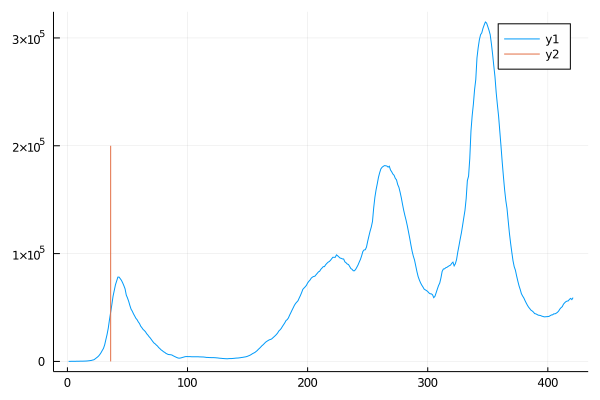

In [4]:
plot(sum(real_incidence, dims=1)[1,:])
plot!([36, 36], [1, 20e4])

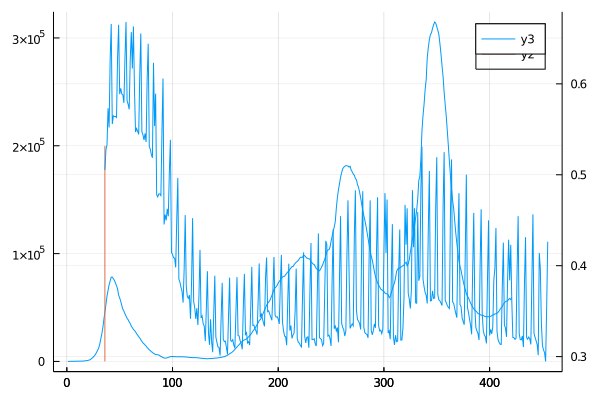

In [5]:
plot!(twinx(), tᶜs, κ₀s)

In [593]:
network = CSV.read(joinpath(data_path, "R_mobility_matrix.csv"), DataFrame)
edgelist = convert(Array{Int64, 2}, network[:, ["source_idx", "target_idx"]])
Rᵢⱼ = copy(network[:, "trips_norm"])

# Number of strata
G = size(nᵢᵍ)[1]

# Number of patches
M = size(nᵢᵍ)[2]

# Strata contacts
C = [0.5980 0.3849 0.0171
     0.2440 0.7210 0.0350
     0.1919 0.5705 0.2376]

# Patch surfaces (in km²)
sᵢ = provincias[:, "area"]

# Average number of contacts per strata
kᵍ = [11.8, 13.3, 6.6]

# Average number of contacts at home per strata
kᵍ_h = [3.15, 3.17, 3.28]

# Average number of contacts at work per strata
kᵍ_w = [1.72, 5.18, 0.0]

# Degree of mobility per strata
pᵍ = [0.0, 1.0, 0.05]

# Density factor
ξ = 0.01

# Average household size
σ = 2.5

# Infectivity of infected
βᴵ = 0.075

# Infectivity of asymptomatic
βᴬ = 0.5 * βᴵ

# Exposed rate
ηᵍ = [1/2.444, 1/2.444, 1/2.444]

# Asymptomatic infectious rate
αᵍ = [1/5.671, 1/2.756, 1/2.756]

# Infectious rate
μᵍ = [1/1.0, 1/3.915, 1/3.915]

# Direct death probability
θᵍ = [0.0, 0.008, 0.047]

# ICU probability
γᵍ = [0.0003, 0.003, 0.026]

# Pre-deceased rate
ζᵍ = [1/7.084, 1/7.084, 1/7.084]

# Pre-hospitalized in ICU rate
λᵍ = [1/4.084, 1/4.084, 1/4.084]

# Fatality probability in ICU
ωᵍ = [0.3, 0.3, 0.3]

# Death rate in iCU
ψᵍ = [1/7.0, 1/7.0, 1/7.0]

# ICU discharge rate
χᵍ = [1/20.0, 1/20.0, 1/20.0]

# Number of timesteps
T = 10

# # Timestep of application of containment
# tᶜ = 30

# # Mobility reduction
# κ₀ = 0.65

# # Permeability of confined households
# ϕ = 0.174

# # Social distancing
# δ = 0.207

# # List of timesteps of application of containments
# tᶜs = [30, 60, 90, 120]

# # List of mobility reductions
# κ₀s = [0.65, 0.75, 0.65, 0.55]

# # List of permeabilities of confined households
# ϕs = [0.174, 0.174, 0.174, 0.174]

# # List of social distancings
# δs = [0.207, 0.207, 0.207, 0.207]

# Array of premeabilities of confined households
ϕs = ones(Float64, length(tᶜs))

# Array of social distancing measures
δs = zeros(Float64, length(tᶜs))
nothing

In [501]:

function sample_initial_parameters(num_params)
    DataFrame(
        id=1:num_params,
        beta=rand(Uniform(0, 1), num_params),
        scale_beta=rand(Uniform(0.4, 0.6), num_params)
    )
end

function resample_parameters(accepted, num_params)
    params_names = ["beta", "scale_beta"]
    Σ = cov(Array(accepted[:, params_names]))
    μ = mean(Array(accepted[:, params_names]), dims=1)[1,:]
    values = rand(MvNormal(μ, Σ), num_params)
    df = DataFrame(transpose(values), params_names)
    df[:, "id"] = 1:num_params
    return df
end

function resample_compartments(compartments, sample_size=10000)
    # Resample compartments at a given time
    # Input compartments should have shape: (G, M, num_compartments, num_params)
    # Output have the same shape as input
    G, M, num_compartments, num_params = size(compartments)
    X = transpose(reshape(compartments[:,:,:,:], (G*M*num_compartments, num_params)))
    μ = mean(X, dims=1)[1,:]
    Σ = cov(X)
    Σ = Σ + 1e-15*I # avoid problem: "Cholesky factorization failed", as some variables appear to be linear combinations of others, I think it might be (i did not checked) several age groups of the same patch. More info here: https://stackoverflow.com/questions/57559589/distributions-jl-do-not-accept-my-non-positive-definite-covariance-function-w
    new_compartments = rand(MvNormal(μ, Σ), sample_size)
    return reshape(new_compartments, (G, M, num_compartments, sample_size))
end


function calculate_incidence_and_prevalence(epi_params, population)
    prevalence = sum((epi_params.ρᴵᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴴᴰᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴴᴿᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴾᴴᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴾᴰᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴰᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴿᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴬᵍ[:, :, 1:epi_params.T] .+
                                       epi_params.ρᴱᵍ[:, :, 1:epi_params.T]) .*
                                      population.nᵢᵍ, dims = (1))[1,:,:]
    incidence = diff(prevalence, dims=2)
    return incidence, prevalence
end

function compartments_as_matrix(epi_params, population)
    num_compartments = 10
    compartments_names = ["S", "E", "A", "I", "PH", "PD", "HR", "HD", "D", "R"]
    compartments = NamedArray(
        zeros(population.G, population.M, epi_params.T, num_compartments),
        (1:population.G, 1:population.M, 1:epi_params.T, compartments_names),
        ("G", "M", "t", "compartment")
    )
    compartments[:, :, :, 1] = epi_params.ρˢᵍ .* population.nᵢᵍ
    compartments[:, :, :, 2] = epi_params.ρᴱᵍ .* population.nᵢᵍ
    compartments[:, :, :, 3] = epi_params.ρᴬᵍ .* population.nᵢᵍ
    compartments[:, :, :, 4] = epi_params.ρᴵᵍ .* population.nᵢᵍ
    compartments[:, :, :, 5] = epi_params.ρᴾᴴᵍ .* population.nᵢᵍ
    compartments[:, :, :, 6] = epi_params.ρᴾᴰᵍ .* population.nᵢᵍ
    compartments[:, :, :, 7] = epi_params.ρᴴᴿᵍ .* population.nᵢᵍ
    compartments[:, :, :, 8] = epi_params.ρᴴᴰᵍ .* population.nᵢᵍ
    compartments[:, :, :, 9] = epi_params.ρᴰᵍ .* population.nᵢᵍ
    compartments[:, :, :, 10] = epi_params.ρᴿᵍ .* population.nᵢᵍ
    return compartments
end

function store_compartments!(compartments, i, epi_params, population)
    compartments[:, :, :, 1, i] = epi_params.ρˢᵍ .* population.nᵢᵍ
    compartments[:, :, :, 2, i] = epi_params.ρᴱᵍ .* population.nᵢᵍ
    compartments[:, :, :, 3, i] = epi_params.ρᴬᵍ .* population.nᵢᵍ
    compartments[:, :, :, 4, i] = epi_params.ρᴵᵍ .* population.nᵢᵍ
    compartments[:, :, :, 5, i] = epi_params.ρᴾᴴᵍ .* population.nᵢᵍ
    compartments[:, :, :, 6, i] = epi_params.ρᴾᴰᵍ .* population.nᵢᵍ
    compartments[:, :, :, 7, i] = epi_params.ρᴴᴿᵍ .* population.nᵢᵍ
    compartments[:, :, :, 8, i] = epi_params.ρᴴᴰᵍ .* population.nᵢᵍ
    compartments[:, :, :, 9, i] = epi_params.ρᴰᵍ .* population.nᵢᵍ
    compartments[:, :, :, 10, i] = epi_params.ρᴿᵍ .* population.nᵢᵍ
end

function store_incidence!(dest, i, epi_params, population)
    incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
    dest[:,:,i] = incidence
end

function set_compartments!(epi_params, compartments)
    @assert size(compartments) == (size(epi_params.ρˢᵍ)[1], size(epi_params.ρˢᵍ)[2], 10)
    total_population = sum(compartments, dims=(3))[:,:,1]
    epi_params.ρˢᵍ[:,:,1] .= compartments[:, :, 1] ./ total_population
    epi_params.ρᴱᵍ[:,:,1] .= compartments[:, :, 2] ./ total_population
    epi_params.ρᴬᵍ[:,:,1] .= compartments[:, :, 3] ./ total_population
    epi_params.ρᴵᵍ[:,:,1] .= compartments[:, :, 4] ./ total_population
    epi_params.ρᴾᴴᵍ[:,:,1] .= compartments[:, :, 5] ./ total_population
    epi_params.ρᴾᴰᵍ[:,:,1] .= compartments[:, :, 6] ./ total_population
    epi_params.ρᴴᴿᵍ[:,:,1] .= compartments[:, :, 7] ./ total_population
    epi_params.ρᴴᴰᵍ[:,:,1] .= compartments[:, :, 8] ./ total_population
    epi_params.ρᴰᵍ[:,:,1] .= compartments[:, :, 9] ./ total_population
    epi_params.ρᴿᵍ[:,:,1] .= compartments[:, :, 10] ./ total_population
end


function run_simulation(T; initial_compartments=nothing)
    population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
    epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, T)
    
    reset_params!(epi_params, population)
    
    if initial_compartments != nothing
        set_compartments!(epi_params, initial_compartments)
    else
        set_initial_infected!(epi_params, population, E₀, A₀, I₀)
    end

    # Run the model
    run_epidemic_spreading_mmca!(epi_params, population; verbose = true)
    
    return epi_params, population
end

function plot_simulation(compartments)
    totals = sum(compartments, dims=(1,2))[1,1,:,:]
    plot([totals[:, "E"], totals[:, "A"], totals[:, "I"], totals[:, "D"]], label=["E" "A" "I" "D"])
end



function RMSE(x, y; sumpatches=true)
    # esta funcion calcula el Root Mean Square Error de cada trajectoria simulada (x)
    # contra la trajectoria real (y), generando un vector de errores, uno por cada parche
    # Las dimensiones deben ser: 
    #  x = ("parche", "tiempo", "simulacion") ó ("parche", "tiempo")
    #  y = ("parche", "tiempo")
    e = x .- y
    se = map(abs2, e)
    mse = mean(se, dims=2)
    rmse = map(sqrt, mse)
    if sumpatches
        return sum(rmse, dims=1)
    else
        return rmse
    end
end

function RMSE2(x, y)
    # las dimensiones deben ser:
    #  x = ("tiempo", "simulacion")
    #  y = ("tiempo")
    e = x .- y
    se = abs2.(e)
    mse = mean(se, dims=1)
    rmse = sqrt.(mse)
    return rmse
end


function prevalence_and_incidence(simulations)
    prevalence = sum(simulations[:,:,:,1:10 .!= 1,:], dims=(1,4))[1,:,:,1,:]
    incidence = diff(prevalence, dims=2)
    return prevalence, incidence
end

RMSE2([1 2 3 4], transpose([1 2 3 5]))

# transpose([1 2 3 4; 1 2 3 4]) .- [1 2 3 4]
# prevalence_and_incidence(simulations)
# size([1 2 3 4])
# X = transpose([1 2 3 4; 1 2 3 4])
# Y = transpose([1 2 3 4])
# RMSE2(X, Y)[1,:]
# sqrt.(mean(abs2.(X.-Y), dims=1))

1×4 Array{Float64,2}:
 2.29129  1.65831  1.5  1.93649

# Test mobility reduction

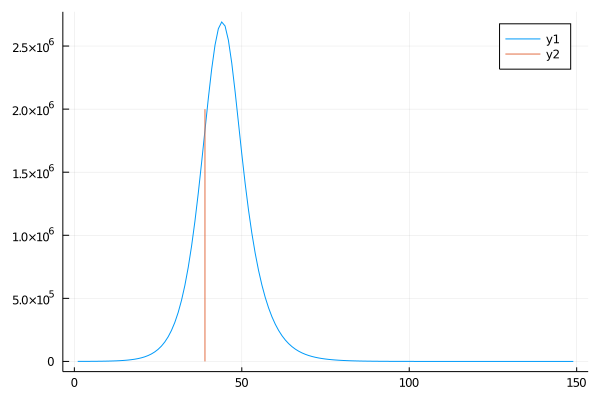

In [970]:
# reusable structures
population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, 150)

# Initial number of infected individuals
E₀ = zeros(G, M)
A₀ = zeros(G, M)
I₀ = zeros(G, M)
# I₀[2,2] = 10
# I₀[2,3] = 10
# I₀[2,5] = 10
# I₀[2,10] = 10
# I₀[2,20] = 1
# I₀[2,40] = 10
# I₀[2,50] = 10
I₀[2, :] .= 15

reset_params!(epi_params, population)
set_initial_infected!(epi_params, population, E₀, A₀, I₀)
run_epidemic_spreading_mmca!(epi_params, population; verbose = false)

incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
ii1 = sum(incidence, dims=1)[1,:]
pp1 = sum(prevalence, dims=1)[1,:]
plot(ii1)
plot!([39, 39], [1, 20e5])

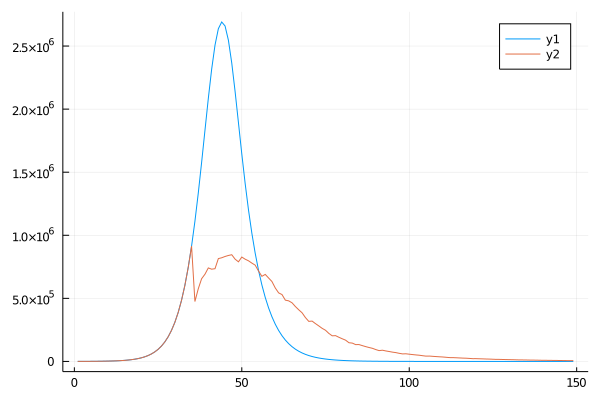

In [971]:
# reusable structures
population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, 150)

reset_params!(epi_params, population)
set_initial_infected!(epi_params, population, E₀, A₀, I₀)
# run_epidemic_spreading_mmca!(epi_params, population, [36, 40], [1,0], [1,1], [1,1]; verbose = false)
run_epidemic_spreading_mmca!(epi_params, population, tᶜs, κ₀s, ones(Float64, length(tᶜs)), zeros(Float64, length(tᶜs)); verbose = false)
# run_epidemic_spreading_mmca!(epi_params, population; tᶜ=36, κ₀=1., verbose = false)

incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
ii2 = sum(incidence, dims=1)[1,:]
pp2 = sum(prevalence, dims=1)[1,:]
plot(ii1)
plot!(ii2)

# Optimize seeds

In [996]:
using Evolutionary

function run_model(params; return_incidences=false)
    beta = params[1]
    scale_beta = params[2]
    seeds = params[3:end]
    
    population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
    epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, T)
    E₀ = zeros(G, M)
    A₀ = zeros(G, M)
    I₀ = zeros(G, M)

    epi_params.βᴵ .= beta
    epi_params.βᴬ .= scale_beta * beta
    E₀[2,:] = seeds

    reset_params!(epi_params, population)
    set_initial_infected!(epi_params, population, E₀, A₀, I₀)
    ϕs = ones(Float64, length(tᶜs)) # Array of premeabilities of confined households
    δs = zeros(Float64, length(tᶜs)) # Array of social distancing measures
    run_epidemic_spreading_mmca!(epi_params, population, tᶜs .- t, κ₀s, ϕs, δs; verbose = false)
    # run_epidemic_spreading_mmca!(epi_params, population; verbose = false)
    
    # calculate incidence and prevalence
    incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)

    # calculate vector of errors (one error for each province)
    # err = sum(abs2.(incidence - real_incidence[:, 1:T-1]), dims=2)[:,1]
    
    # calculate error at spain level
    err = sum(abs2.(sum(incidence, dims=1)[1,:] - sum(real_incidence[:, 1:T-1], dims=1)[1,:]))

    if return_incidences
        return incidence, prevalence
    else
        return mean(err)
    end
end

run_model(x0)

1.169654942343527e13

In [992]:
# f(x) = (1.0 - x[1])^2 + 100.0 * (x[2] - x[1]^2)^2 # Rosenbrock
x0 = 10*ones(2+52)
x0[1] = 0.06
x0[2] = 0.5
lower = zeros(2+52)
lower[1] = 0.01 # beta
lower[2] = 0.4 # scale_beta
upper = 100*ones(2+52)
upper[1] = 1
upper[2] = 0.6
T = 400

400

In [ ]:
incidence, prevalence = run_model(x0, return_incidences=true)
nothing

In [1002]:
res = Evolutionary.optimize(run_model, lower, upper, x0, CMAES(), Evolutionary.Options(time_limit=100.))


 * Status: failure (exceeded time limit of 100.0)

 * Candidate solution
    Minimizer:  [0.012981143529119762, 0.4, 55.802937433790575,  ...]
    Minimum:    4.18061605118059e12
    Iterations: 43

 * Found with
    Algorithm: (15,30)-CMA-ES

 * Work counters
    Seconds run:   102.2901 (vs limit 100.0)
    Iterations:    43
    f(x) calls:    1333


In [1000]:
params = Evolutionary.minimizer(res)
incidence, prevalence = run_model(params, return_incidences=true)
nothing

In [1005]:
plot_multiple_provinces_incidence()

In [1004]:
plot_multiple_provinces_prevalence()

In [820]:
num_rounds = 2
pop_size = 1000
num_provinces = 52
num_accept = 100
T = 40

# reusable structures
population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, T)

params = DataFrame(
    id=1:pop_size,
    beta=rand(Uniform(0, 1), pop_size),
    scale_beta=rand(Uniform(0.4, 0.6), pop_size)
)

seeds = ones(num_provinces)

# Initial number of exposed individuals
E₀ = zeros(G, M)

# Initial number of infectious asymptomatic individuals
A₀ = zeros(G, M)

# Initial number of infectious symptomatic individuals
I₀ = zeros(G, M)

incidences  = zeros(Float64, M, T - 1, num_simulations)
prevalences  = zeros(Float64, M, T, num_simulations)

for r in 1:num_rounds
    println("round $r")
    errors = zeros(pop_size)
    for i in 1:pop_size
        beta = params[i, "beta"]
        scale_beta = params[i, "scale_beta"]
        epi_params.βᴵ .= beta
        epi_params.βᴬ .= scale_beta * beta
        E₀ .= 0 # reset with 0
        E₀[2,:] = seeds

        reset_params!(epi_params, population)
        set_initial_infected!(epi_params, population, E₀, A₀, I₀)
        run_epidemic_spreading_mmca!(epi_params, population; verbose = false)
        incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
        incidences[:,:,i] = incidence
        prevalences[:,:,i] = prevalence
        
        # calculate errors
        err = sum(abs2.(incidence - real_incidence[:, 1:T-1]))
        errors[i] = err
    end

    params[!,:error] = errors
    accepted_params = sort(params, "error")[1:num_accept, :]
    accepted_indexes = accepted_params[:, "id"]
    accepted_incidences = incidences[:,:,accepted_indexes]
    
    # recalcular el error, esta vez sin hacer el error absoluto..
    errors = sum(accepted_incidences .- real_incidence[:, 1:T-1], dims=2)[:,1,:]
    
    mean_errors = mean(errors, dims=2)
    unitary_mean_errors = mean()
    # println(accepted_params)
    println(size(errors))
end


round 1
(52, 100)
round 2
(52, 100)


In [821]:
errors

UndefVarError: UndefVarError: errors not defined

In [346]:
num_simulations = 1000
num_population = 1000
num_accept = 100
num_provinces = 52
num_params = 2
num_rounds = 20
T = 40
params_names = ["beta", "scale_beta"]

# initial parameters+seeds random
params = rand(Uniform(0, 1), (num_population, num_params+num_provinces)) # initial population of seeds random
params[:, 1] = rand(Uniform(0.01, 0.9), num_population) # beta
params[:, 2] = rand(Uniform(0.4, 0.6), num_population) # scale_beta
provinces_names = provincias[:, "provincia"]
columns = vcat(["beta", "scale_beta"], provinces_names)
params = DataFrame(params, columns)

# reusable structures
population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, T)

# Initial number of exposed individuals
E₀ = zeros(G, M)

# Initial number of infectious asymptomatic individuals
A₀ = zeros(G, M)

# Initial number of infectious symptomatic individuals
I₀ = zeros(G, M)

function resample_params(accepted, num_params, columns)
    # columns = ["beta", "scale_beta"]
    Σ = cov(Array(accepted[:, columns]))
    μ = mean(Array(accepted[:, columns]), dims=1)[1,:]
    values = rand(MvNormal(μ, Σ), num_params)
    df = DataFrame(transpose(values), columns)
    df[:, "id"] = 1:num_params
    return df
end

incidence = nothing
prevalence = nothing
for r in 1:num_rounds
    println(r)
    errors = zeros(num_population)
    for i in 1:num_population
        beta = params[i, "beta"]
        scale_beta = params[i, "scale_beta"]
        epi_params.βᴵ .= beta
        epi_params.βᴬ .= scale_beta * beta
        seeds = Array(params[i, provinces_names])
        A₀ .= 0 # reset with 0
        A₀[2,:] = seeds
        reset_params!(epi_params, population)
        set_initial_infected!(epi_params, population, E₀, A₀, I₀)
        run_epidemic_spreading_mmca!(epi_params, population; verbose = false)
        incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
        err = sum(abs2.(real_incidence[:, 1:39] - incidence))
        errors[i] = err
    end
    params[!,:error] = errors
    accepted_params = sort(params, "error")[1:num_accept, :]
    println(mean(accepted_params[:, "error"]))

    columns = setdiff(Base.names(params), ["error"])
    params = resample_params(accepted_params, num_simulations, columns)
    # println(params)
end

1
1.6864552575177002e10
2
8.330188979170122e9
3
7.640476041594819e9
4
7.343910326133685e9
5
7.231342171956556e9
6
7.163913843139811e9
7
7.122184971386427e9
8
7.0956073061719475e9
9
7.079046484350217e9
10
7.068803033084709e9
11
7.062091384886857e9
12
7.057291369628646e9
13
7.054441390809064e9
14
7.052668447485696e9
15
7.051570001351083e9
16
7.050845016325512e9
17
7.05038543109264e9
18
7.050093438976697e9
19
7.049925372791783e9
20
7.049818379644992e9


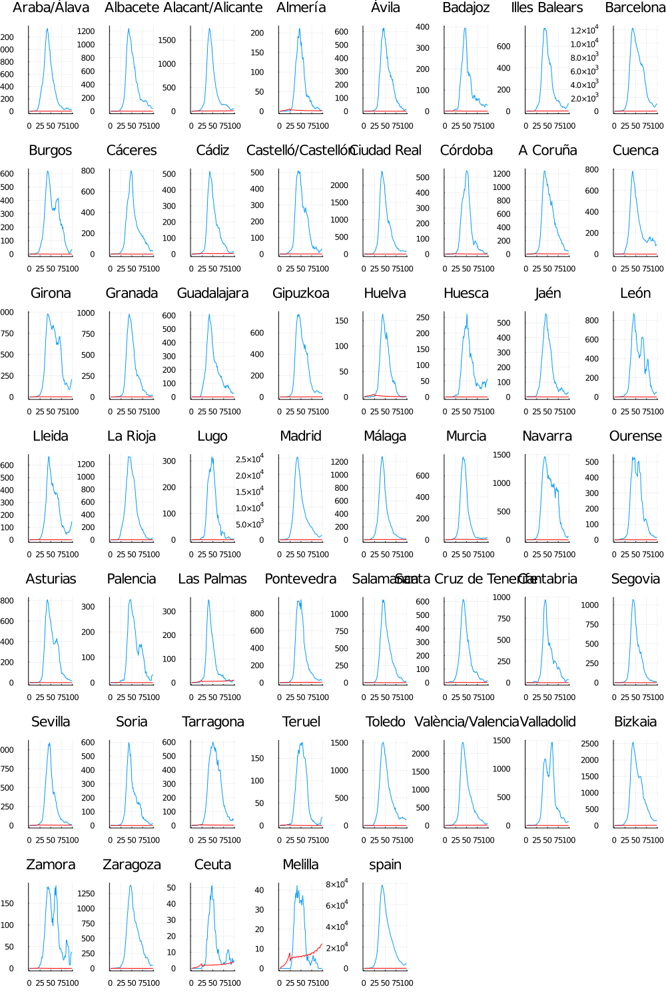

In [907]:

function plot_multiple_provinces_incidence()
    num_provinces = 52 
    limit = T-1
    fig = plot(layout=num_provinces+1, legend=false, size=(1000, 1500))
    for i in 1:num_provinces
        plot!(fig, real_incidence[i,1:limit], subplot=i, title=provinces_names[i])
        plot!(fig, incidence[i,1:limit], subplot=i, color="red")
    end

    plot!(fig, sum(real_incidence[:, 1:limit], dims=1)[1,:], subplot=num_provinces+1, title="spain")
    plot!(fig, sum(incidence[:,1:limit], dims=1)[1,:], subplot=num_provinces+1, color="red")

    return fig
end
plot_multiple_provinces_incidence()

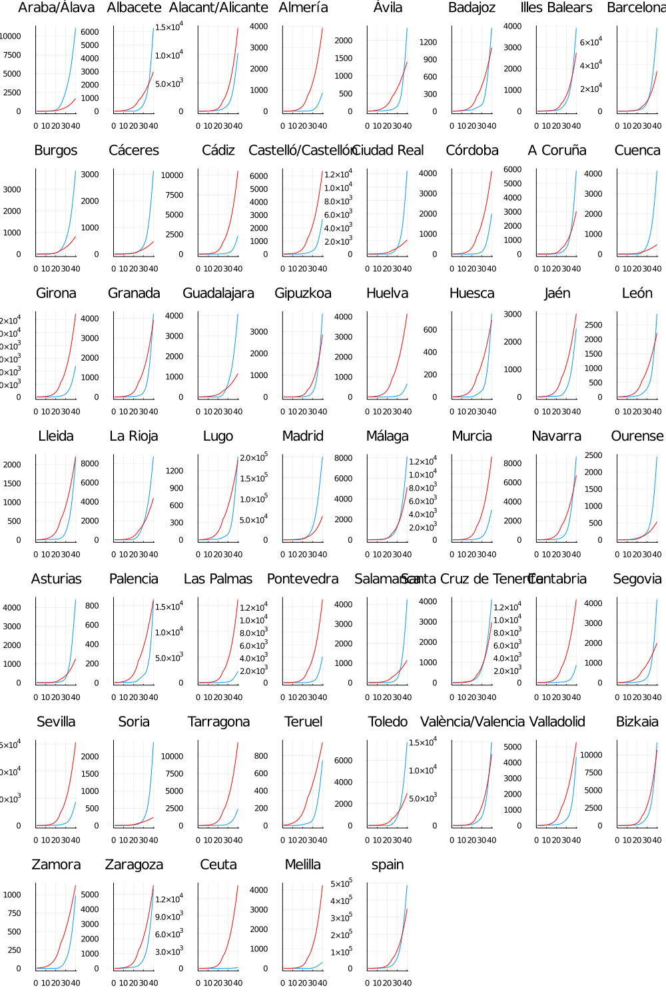

In [879]:

function plot_multiple_provinces_prevalence()
    num_provinces = 52 
    limit = T
    fig = plot(layout=num_provinces+1, legend=false, size=(1000, 1500))
    for i in 1:num_provinces
        plot!(fig, real_prevalence[i,1:limit], subplot=i, title=provinces_names[i])
        plot!(fig, prevalence[i,1:limit], subplot=i, color="red")
    end

    plot!(fig, sum(real_prevalence[:, 1:limit], dims=1)[1,:], subplot=num_provinces+1, title="spain")
    plot!(fig, sum(prevalence[:,1:limit], dims=1)[1,:], subplot=num_provinces+1, color="red")

    return fig
end

plot_multiple_provinces_prevalence()

# Run workflow

In [604]:
num_windows = 7
window_size = 10
T = 40
num_compartments = 10
num_simulations = 1000
num_accept = 100
rounds_optimization = 2
params_names = ["beta", "scale_beta"]

# Initial number of exposed individuals
E₀ = zeros(G, M)

# Initial number of infectious asymptomatic individuals
A₀ = zeros(G, M)
A₀[2,:] = provincias[:, "seed"]

# Initial number of infectious symptomatic individuals
I₀ = zeros(G, M)

# reusable structures
population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, T)

# Arrays where the output variables will be stored
incidences  = zeros(Float64, M, T - 1, num_simulations)
prevalences  = zeros(Float64, M, T, num_simulations)
compartments = zeros(Float64, G, M, T, num_compartments, num_simulations)
best_compartments = zeros(Float64, G, M, T, num_compartments, num_accept, num_windows)
best_incidences = zeros(Float64, M, T-1, num_accept, num_windows)
best_prevalences = zeros(Float64, M, T, num_accept, num_windows)
chosen_incidences = zeros(Float64, M, T-1, num_windows)
chosen_prevalences = zeros(Float64, M, T, num_windows)
nothing

In [605]:
# first round initial compartments are null
initial_compartments = nothing
accepted_compartments = nothing
accepted_params = nothing
accepted_incidences = nothing
accepted_prevalences = nothing
t = 1

for w in 1:num_windows
    tend = t+window_size
    println("window $w: $t - $tend")
    
    params = sample_initial_parameters(num_simulations)
    for r in 1:rounds_optimization
        println("  round $r")
        for i in 1:num_simulations
            beta, scale_beta = params[i, params_names]
            epi_params.βᴵ .= beta
            epi_params.βᴬ .= scale_beta * beta
            
            reset_params!(epi_params, population)

            if initial_compartments == nothing
                set_initial_infected!(epi_params, population, E₀, A₀, I₀)
            else
                set_compartments!(epi_params, initial_compartments)
            end
            
            # Run the model
            ϕs = ones(Float64, length(tᶜs)) # Array of premeabilities of confined households
            δs = zeros(Float64, length(tᶜs)) # Array of social distancing measures
            run_epidemic_spreading_mmca!(epi_params, population, tᶜs .- t, κ₀s, ϕs, δs; verbose = false)

            # Store compartments
            store_compartments!(compartments, i, epi_params, population)

            # calculate incidence and prevalence
            incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
            incidences[:,:,i] = incidence
            prevalences[:,:,i] = prevalence
            
        end
        # println(size(sum(prevalences[:, 1:window_size+1, :], dims=1)[1,:,:]))
        # println(size(sum(real_prevalence[:, t:t+window_size], dims=1)[1,:]))        
        
        score_incidence = RMSE2(sum(incidences[:, 1:window_size, :], dims=1)[1,:,:], sum(real_incidence[:, t+1:t+window_size], dims=1)[1,:])[1,:]
        score_prevalence = RMSE2(sum(prevalences[:, 1:window_size+1, :], dims=1)[1,:,:], sum(real_prevalence[:, t:t+window_size], dims=1)[1,:])[1,:]
        
        params[!, "score_incidence"] = score_incidence
        params[!, "score_prevalence"] = score_prevalence
        
        accepted_params = sort(params, "score_prevalence")[1:num_accept, :]
        # println(accepted_params[1:10,:])
        accepted_indexes = accepted_params[:, "id"]
        accepted_compartments = compartments[:,:,:,:,accepted_indexes]
        accepted_incidences = incidences[:,:,accepted_indexes]
        accepted_prevalences = prevalences[:,:,accepted_indexes]
        params = resample_parameters(accepted_params, num_simulations)
    end
    
    best_incidences[:, :, :, w] = accepted_incidences
    best_prevalences[:, :, :, w] = accepted_prevalences
    best_compartments[:, :, :, :, :, w] = accepted_compartments
    
    # best simulation at first incidence
    real_first_point = sum(real_incidence, dims=1)[1, t] # real incidence at the beginning of the window
    sim_first_points = sum(accepted_incidences, dims=1)[1,1,:] # simulated incidences at the beginning of the window, one per simulation
    dist_first_incid = abs.(sim_first_points .- real_first_point)
    best_first_incid = argmin(dist_first_incid)
    
    # best simulation at last incidence
    real_last_point = sum(real_incidence, dims=1)[1, tend] # real incidence at the end of the window
    sim_last_points = sum(accepted_incidences, dims=1)[1,window_size,:] # simulated incidences at the end of the window, one per simulation
    dist_last_incid = abs.(sim_last_points .- real_last_point)
    best_last_incid = argmin(dist_last_incid)
    
    # best simulation at last prevalence
    real_last_point = sum(real_prevalence, dims=1)[1, tend] # real prevalence at the end of the window
    sim_last_points = sum(accepted_prevalences, dims=1)[1,window_size+1,:] # simulated prevalences at the end of the window, one per simulation
    dist_last_prev = abs.(sim_last_points .- real_last_point)
    best_last_prev = argmin(dist_last_prev)
    
    # combined minimum
    distances_mix = (5 .* dist_last_prev) .+ (1 .* dist_last_incid) .+ (1 .* dist_first_incid)
    best_by_mix = argmin(distances_mix)
    
    best = best_by_mix
    
    chosen_incidences[:,:,w] = accepted_incidences[:,:,best]
    chosen_prevalences[:,:,w] = accepted_prevalences[:,:,best]
    
    # accepted_params[:, "distances_at_end"] = distances
    
    # println(accepted_params[1:10, :])
    println("  finished w: $w, t=$t, Best: $best")

    initial_compartments = accepted_compartments[:,:,window_size+1,:,best]
    
    t += window_size
end

window 1: 1 - 11
  round 1
  round 2
  finished w: 1, t=1, Best: 91
window 2: 11 - 21
  round 1
  round 2
  finished w: 2, t=11, Best: 50
window 3: 21 - 31
  round 1
  round 2
  finished w: 3, t=21, Best: 12
window 4: 31 - 41
  round 1
  round 2
  finished w: 4, t=31, Best: 67
window 5: 41 - 51
  round 1
  round 2
  finished w: 5, t=41, Best: 23
window 6: 51 - 61
  round 1
  round 2
  finished w: 6, t=51, Best: 1
window 7: 61 - 71
  round 1
  round 2
  finished w: 7, t=61, Best: 1


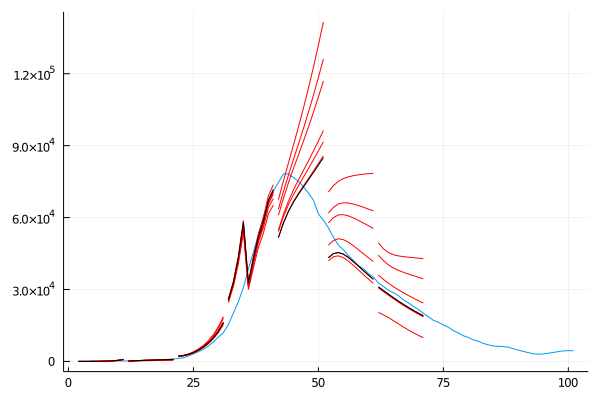

In [608]:
best_incidences_spain = sum(best_incidences, dims=1)[1,:,:,:]
chosen_incidences_spain = sum(chosen_incidences, dims=1)[1,:,:,:]

Y = sum(real_incidence, dims=1)[1,1:100]
X = 2:length(Y)+1 # the first value of incidence is for the second day
plot(X, Y)

npoints = window_size
X = zeros(npoints, num_windows)
for i in 1:num_windows
    X[:,i] = 2+(window_size*(i-1)):window_size*(i-1)+npoints+1
end
plot!(X, best_incidences_spain[1:npoints,1,:], color="red")
plot!(X, best_incidences_spain[1:npoints,3,:], color="red")
plot!(X, best_incidences_spain[1:npoints,20,:], color="red")
plot!(X, best_incidences_spain[1:npoints,50,:], color="red")
plot!(X, best_incidences_spain[1:npoints,70,:], color="red")
plot!(X, best_incidences_spain[1:npoints,100,:], color="red")
plot!(X, chosen_incidences_spain[1:npoints,:], color="black", legend=false)


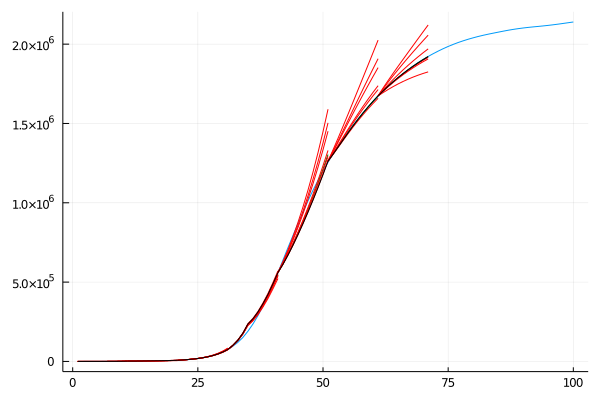

In [607]:
best_prevalences_spain = sum(best_prevalences, dims=1)[1,:,:,:]
chosen_prevalences_spain = sum(chosen_prevalences, dims=1)[1,:,:,:]

Y = sum(real_prevalence, dims=1)[1,1:100]
X = 1:length(Y)
plot(X, Y)


npoints = window_size+1
X = zeros(npoints, num_windows)
for i in 1:num_windows
    X[:,i] = 1+(window_size*(i-1)):window_size*(i-1)+npoints
end
plot!(X, best_prevalences_spain[1:npoints,1,:], color="green")
plot!(X, best_prevalences_spain[1:npoints,3,:], color="red")
plot!(X, best_prevalences_spain[1:npoints,10,:], color="red")
plot!(X, best_prevalences_spain[1:npoints,20,:], color="red")
plot!(X, best_prevalences_spain[1:npoints,50,:], color="red")
plot!(X, best_prevalences_spain[1:npoints,70,:], color="red")
plot!(X, best_prevalences_spain[1:npoints,100,:], color="red")
plot!(X, chosen_prevalences_spain[1:npoints,:], color="black", legend=false)


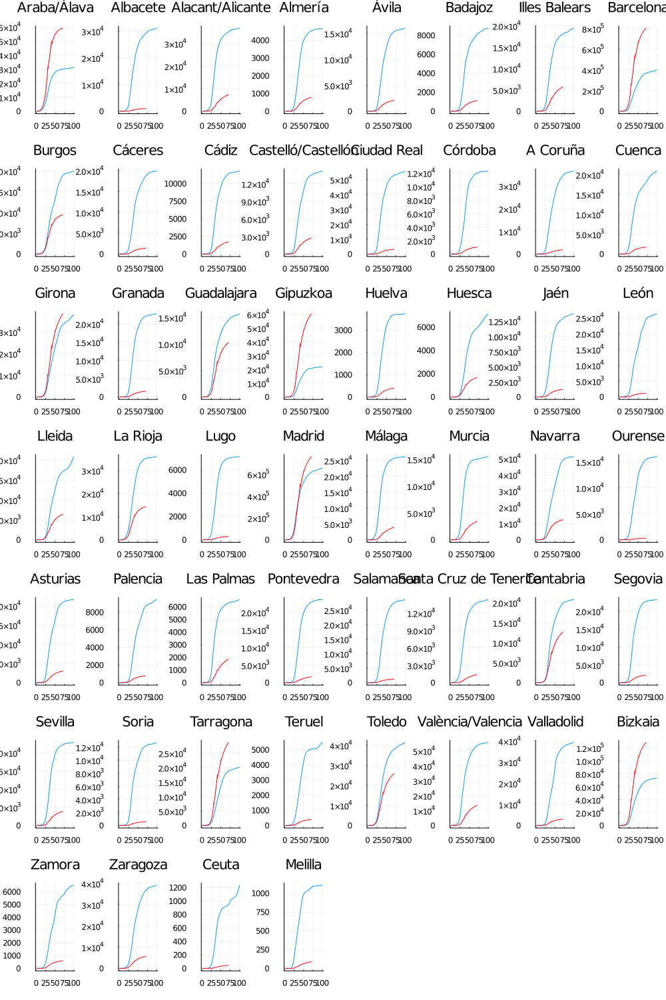

In [332]:
# selected_provinces_names = ["Alaba", "Baleares", "Barcelona", "Granada", "Madrid", "Sevilla"]
# selected_provinces_idx = [1, 7, 8, 18, 28, 41]
selected_provinces_names = provincias[:, "provincia"]
selected_provinces_idx = provincias[:, "idx"]

num_plots = length(selected_provinces_idx)
fig = plot(layout=num_plots, legend=false, size=(1000, 1500))
limit = 100

npoints = window_size+1
X = zeros(npoints, num_windows)
for i in 1:num_windows
    X[:,i] = 1+(window_size*(i-1)):window_size*(i-1)+npoints
end

for i in 1:num_plots
    idx = selected_provinces_idx[i]
    plot!(fig, 1:limit, real_prevalence[idx,1:limit], subplot=i, title=selected_provinces_names[i])
    plot!(fig, X, best_prevalences[idx,1:npoints,1,:], subplot=i, color="red")
end

fig

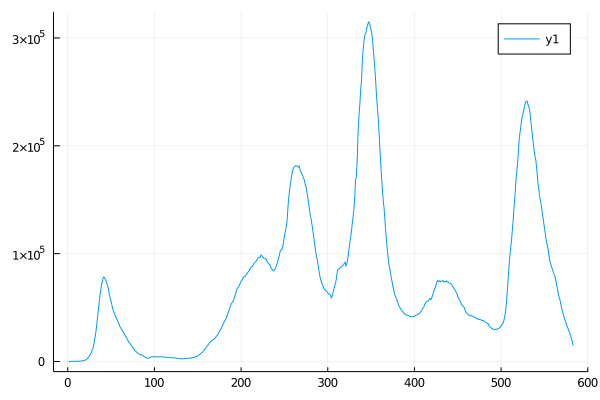

In [203]:
plot(sum(real_incidence[:,1:end], dims=1)[1,:])

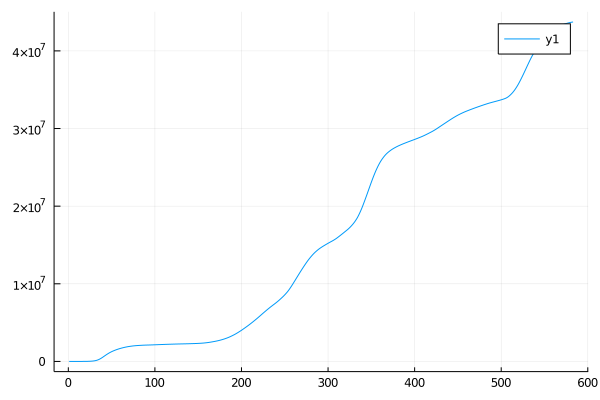

In [204]:
plot(sum(real_prevalence[:,1:end], dims=1)[1,:])

# test Evolutionary

In [628]:
using Evolutionary

function run_model(beta, scale_beta)

    population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
    epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, T)

    epi_params.βᴵ .= beta
    epi_params.βᴬ .= scale_beta * beta

    reset_params!(epi_params, population)

    if initial_compartments == nothing
        set_initial_infected!(epi_params, population, E₀, A₀, I₀)
    else
        set_compartments!(epi_params, initial_compartments)
    end

    # Run the model
    ϕs = ones(Float64, length(tᶜs)) # Array of premeabilities of confined households
    δs = zeros(Float64, length(tᶜs)) # Array of social distancing measures
    run_epidemic_spreading_mmca!(epi_params, population, tᶜs .- t, κ₀s, ϕs, δs; verbose = false)
    
    # calculate incidence and prevalence
    incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
    return incidence, prevalence
end


# f(x) = (1.0 - x[1])^2 + 100.0 * (x[2] - x[1]^2)^2 # Rosenbrock
# x0 = [0.0, 0.0];
# Evolutionary.optimize(f, x0, CMAES())
incidence, prevalence = run_model(0.5, 0.5)
incidence

52×39 Array{Float64,2}:
  11406.2      10109.9      20030.4    …  7.35244e-6   5.69044e-6
    828.575      783.893     1863.05      0.000357357  0.000273701
   9558.63      9139.06     23767.1       1.86032e-7   1.42492e-7
   3125.87      2913.04      6579.48      1.14192e-5   8.7521e-6
   1262.24      1186.96      2760.02      0.000190282  0.000146717
    787.016      745.914     1776.32   …  0.000486058  0.000370439
   5221.43      4999.49     12998.6       2.67057e-7   2.05124e-7
 410143.0     352879.0     709356.0       1.25356e-6   9.73232e-7
   2908.46      2702.09      5980.65      0.000276608  0.000213169
    958.109      904.939     2120.51      0.000584388  0.000447361
   1676.96      1608.05      4165.9    …  1.10059e-6   8.38423e-7
   2200.61      2098.49      5281.44      5.60971e-6   4.30504e-6
   2024.81      1917.42      4576.69      0.000298022  0.000228904
      ⋮                                ⋱               
   3329.76      3182.99      8132.83   …  1.97953e-6   1.

# Workflow 2, advance day-by-day

In [767]:
T = 50
window_size = T
step_size = 1
num_steps = 100
population_size = 1000
num_iterations = 1
num_accept = 100
num_compartments = 10
params_names = ["beta", "scale_beta"]

# Initial number of exposed individuals
E₀ = zeros(G, M)

# Initial number of infectious asymptomatic individuals
A₀ = zeros(G, M)
A₀[2,:] = provincias[:, "seed"]

# Initial number of infectious symptomatic individuals
I₀ = zeros(G, M)

# reusable structures
population = Population_Params(G, M, nᵢᵍ, kᵍ, kᵍ_h, kᵍ_w, C, pᵍ, edgelist, Rᵢⱼ, sᵢ, ξ, σ)
epi_params = Epidemic_Params(βᴵ, βᴬ, ηᵍ, αᵍ, μᵍ, θᵍ, γᵍ, ζᵍ, λᵍ, ωᵍ, ψᵍ, χᵍ, G, M, T)

# Arrays where the output variables will be stored
iteration_incidences  = zeros(Float64, M, T - 1, population_size)
iteration_prevalences  = zeros(Float64, M, T, population_size)
iteration_compartments = zeros(Float64, G, M, T, num_compartments, population_size)
best_compartments = zeros(Float64, G, M, T, num_compartments, num_accept, num_steps)
best_incidences = zeros(Float64, M, T-1, num_accept, num_steps)
best_prevalences = zeros(Float64, M, T, num_accept, num_steps)
chosen_incidences = zeros(Float64, M, T-1, num_steps)
chosen_prevalences = zeros(Float64, M, T, num_steps)
nothing

In [768]:
# first round initial compartments are null
initial_compartments = nothing
accepted_compartments = nothing
accepted_params = nothing
accepted_incidences = nothing
accepted_prevalences = nothing
tstart = 1

for s in 1:num_steps
    tend = tstart+window_size-1
    println("step $s: $tstart - $tend")
    
    # parameters for first iteration are sampled from uniform distribution 
    params = sample_initial_parameters(population_size)

    for r in 1:num_iterations
        println("  iteration $r")
        
        for i in 1:population_size
            beta, scale_beta = params[i, params_names]
            epi_params.βᴵ .= beta
            epi_params.βᴬ .= scale_beta * beta
            
            reset_params!(epi_params, population)

            if initial_compartments == nothing
                set_initial_infected!(epi_params, population, E₀, A₀, I₀)
            else
                set_compartments!(epi_params, initial_compartments)
            end
            
            # Run the model
            ϕs = ones(Float64, length(tᶜs)) # Array of premeabilities of confined households
            δs = zeros(Float64, length(tᶜs)) # Array of social distancing measures
            run_epidemic_spreading_mmca!(epi_params, population, tᶜs .- tstart, κ₀s, ϕs, δs; verbose = false)

            # Store compartments
            store_compartments!(iteration_compartments, i, epi_params, population)

            # calculate incidence and prevalence
            incidence, prevalence = calculate_incidence_and_prevalence(epi_params, population)
            iteration_incidences[:,:,i] = incidence
            iteration_prevalences[:,:,i] = prevalence
            
        end
        
        # calculate score at spain level
        xx = sum(iteration_incidences, dims=1)[1,:,:]
        yy = sum(real_incidence[:, tstart+1:tend], dims=1)[1,:]
        score_incidence = RMSE2(xx, yy)[1,:]
        
        # calculate score at spain level
        xx = sum(iteration_prevalences, dims=1)[1,:,:]
        yy = sum(real_prevalence[:, tstart:tend], dims=1)[1,:]
        score_prevalence = RMSE2(xx, yy)[1,:]

        params[!, "score_incidence"] = score_incidence
        params[!, "score_prevalence"] = score_prevalence
        
        accepted_params = sort(params, "score_prevalence")[1:num_accept, :]
        # println(accepted_params[1:10,:])
        accepted_indexes = accepted_params[:, "id"]
        accepted_compartments = iteration_compartments[:,:,:,:,accepted_indexes]
        accepted_incidences = iteration_incidences[:,:,accepted_indexes]
        accepted_prevalences = iteration_prevalences[:,:,accepted_indexes]
        params = resample_parameters(accepted_params, num_simulations)
    end
    
    best_incidences[:, :, :, s] = accepted_incidences
    best_prevalences[:, :, :, s] = accepted_prevalences
    best_compartments[:, :, :, :, :, s] = accepted_compartments
    
    # best simulation for all the window
    dist_all_window_prev = accepted_params[:, "score_prevalence"]
    dist_all_window_incid = accepted_params[:, "score_incidence"]
    
    # best simulation at first incidence
    real_first_point = sum(real_incidence, dims=1)[1, tstart] # real incidence at the beginning of the window
    sim_first_points = sum(accepted_incidences, dims=1)[1,1,:] # simulated incidences at the beginning of the window, one per simulation
    dist_first_incid = abs.(sim_first_points .- real_first_point)
    best_first_incid = argmin(dist_first_incid)
    
    # best simulation at last incidence
    real_last_point = sum(real_incidence, dims=1)[1, tend] # real incidence at the end of the window
    sim_last_points = sum(accepted_incidences, dims=1)[1,window_size-1,:] # simulated incidences at the end of the window, one per simulation
    dist_last_incid = abs.(sim_last_points .- real_last_point)
    best_last_incid = argmin(dist_last_incid)
    
    # best simulation at last prevalence
    real_last_point = sum(real_prevalence, dims=1)[1, tend] # real prevalence at the end of the window
    sim_last_points = sum(accepted_prevalences, dims=1)[1,window_size,:] # simulated prevalences at the end of the window, one per simulation
    dist_last_prev = abs.(sim_last_points .- real_last_point)
    best_last_prev = argmin(dist_last_prev)
    
    # best simulation at step prevalence
    real_step_point = sum(real_prevalence, dims=1)[1, tstart+step_size] # real prevalence at the end of the step
    sim_step_points = sum(accepted_prevalences, dims=1)[1,1+step_size,:] # simulated prevalences at the end of the step, one per simulation
    dist_step_prev = abs.(sim_step_points .- real_step_point)
    best_step_prev = argmin(dist_step_prev)
    
    
    # combined minimum
    # distances_mix = (5 .* dist_last_prev) .+ (1 .* dist_last_incid) .+ (1 .* dist_first_incid)
    distances_mix = dist_step_prev
    best_by_mix = argmin(distances_mix)
    
    best = best_by_mix
    
    chosen_incidences[:,:,s] = accepted_incidences[:,:,best]
    chosen_prevalences[:,:,s] = accepted_prevalences[:,:,best]
    
    # accepted_params[:, "distances_at_end"] = distances
    
    # println(accepted_params[1:10, :])
    println("  finished step $s, tstart=$tstart, Best: $best")

    initial_compartments = accepted_compartments[:,:,1+step_size,:,best]
    
    tstart += step_size
end

step 1: 1 - 50
  iteration 1
  finished step 1, tstart=1, Best: 100
step 2: 2 - 51
  iteration 1
  finished step 2, tstart=2, Best: 40
step 3: 3 - 52
  iteration 1
  finished step 3, tstart=3, Best: 39
step 4: 4 - 53
  iteration 1
  finished step 4, tstart=4, Best: 100
step 5: 5 - 54
  iteration 1
  finished step 5, tstart=5, Best: 100
step 6: 6 - 55
  iteration 1
  finished step 6, tstart=6, Best: 28
step 7: 7 - 56
  iteration 1
  finished step 7, tstart=7, Best: 100
step 8: 8 - 57
  iteration 1
  finished step 8, tstart=8, Best: 100
step 9: 9 - 58
  iteration 1
  finished step 9, tstart=9, Best: 100
step 10: 10 - 59
  iteration 1
  finished step 10, tstart=10, Best: 100
step 11: 11 - 60
  iteration 1
  finished step 11, tstart=11, Best: 100
step 12: 12 - 61
  iteration 1
  finished step 12, tstart=12, Best: 100
step 13: 13 - 62
  iteration 1
  finished step 13, tstart=13, Best: 100
step 14: 14 - 63
  iteration 1
  finished step 14, tstart=14, Best: 100
step 15: 15 - 64
  iteration 1


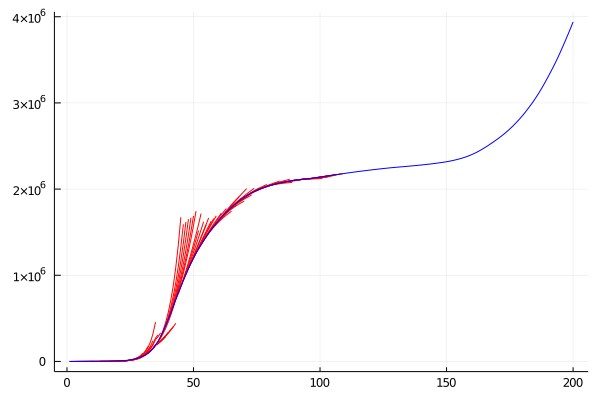

In [785]:
npoints = 10 # number of points to show in the plot
X = zeros(npoints, num_steps)
tstart = 1
for i in 1:num_steps
    tend = tstart+window_size-1
    X[:,i] = tstart:tstart+npoints-1
    tstart += step_size
end

plot(X, sum(chosen_prevalences[:, 1:npoints,:], dims=1)[1,:,:], color="red", legend=false)
plot!(sum(real_prevalence, dims=1)[1,1:200], color="blue")


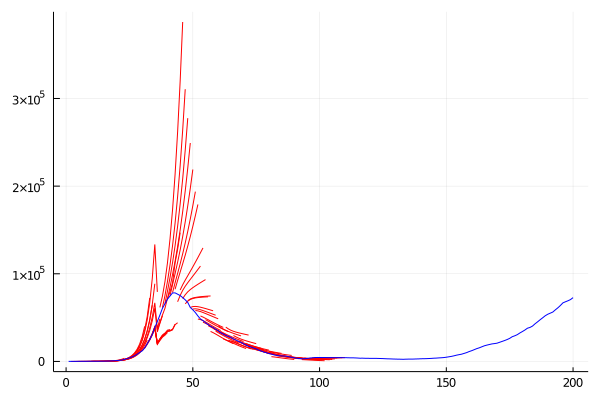

In [788]:
npoints = 10 # number of points to show in the plot
X = zeros(npoints, num_steps)
tstart = 1
for i in 1:num_steps
    tend = tstart+window_size-1
    X[:,i] = tstart+1:tstart+npoints
    tstart += step_size
end

plot(X, sum(chosen_incidences[:, 1:npoints,:], dims=1)[1,:,:], color="red", legend=false)
plot!(sum(real_incidence, dims=1)[1,1:200], color="blue")
